In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch
from PIL import Image
import os
from collections import Counter, defaultdict
import random

# Set style
plt.style.use('default')
%matplotlib inline

## 1. Load dữ liệu PSG

In [17]:
# Đường dẫn đến dữ liệu
PSG_ROOT = 'datasets/psg'
PSG_JSON = os.path.join(PSG_ROOT, 'psg/psg.json')
COCO_IMAGES = os.path.join(PSG_ROOT, 'coco/coco')
OBJ_CLASSES_FILE = os.path.join(PSG_ROOT, 'obj_classes.txt')
PRED_CLASSES_FILE = 'psg_predicates_list.json'

# Load PSG annotations
print("Loading PSG annotations...")
with open(PSG_JSON, 'r') as f:
    psg_data = json.load(f)

print(f"Total images: {len(psg_data['data'])}")
print(f"Keys in data: {list(psg_data.keys())}")

Loading PSG annotations...
Total images: 48749
Keys in data: ['data', 'thing_classes', 'stuff_classes', 'predicate_classes', 'test_image_ids']


In [18]:
# Load object classes
with open(OBJ_CLASSES_FILE, 'r') as f:
    obj_classes = [line.strip() for line in f.readlines()]

print(f"Number of object classes: {len(obj_classes)}")
print(f"First 10 classes: {obj_classes[:10]}")

Number of object classes: 133
First 10 classes: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light']


In [19]:
# Load predicate classes
with open(PRED_CLASSES_FILE, 'r') as f:
    pred_classes = json.load(f)

print(f"Number of predicate classes: {len(pred_classes)}")
print(f"First 10 predicates: {pred_classes[:10]}")

Number of predicate classes: 57
First 10 predicates: ['__background__', 'over', 'in front of', 'beside', 'on', 'in', 'attached to', 'hanging from', 'on back of', 'falling off']


## 2. Phân tích thống kê dataset

In [20]:
# Thống kê cơ bản
total_images = len(psg_data['data'])
total_objects = 0
total_relations = 0
objects_per_image = []
relations_per_image = []
object_class_counts = Counter()
predicate_counts = Counter()

for img_data in psg_data['data']:
    num_objects = len(img_data['annotations'])
    num_relations = len(img_data['relations'])
    
    objects_per_image.append(num_objects)
    relations_per_image.append(num_relations)
    total_objects += num_objects
    total_relations += num_relations
    
    # Count object classes
    for ann in img_data['annotations']:
        object_class_counts[ann['category_id']] += 1
    
    # Count predicates
    for rel in img_data['relations']:
        predicate_counts[rel[2]] += 1

print(f"Total images: {total_images}")
print(f"Total objects: {total_objects}")
print(f"Total relations: {total_relations}")
print(f"Average objects per image: {np.mean(objects_per_image):.2f}")
print(f"Average relations per image: {np.mean(relations_per_image):.2f}")

Total images: 48749
Total objects: 538153
Total relations: 275371
Average objects per image: 11.04
Average relations per image: 5.65


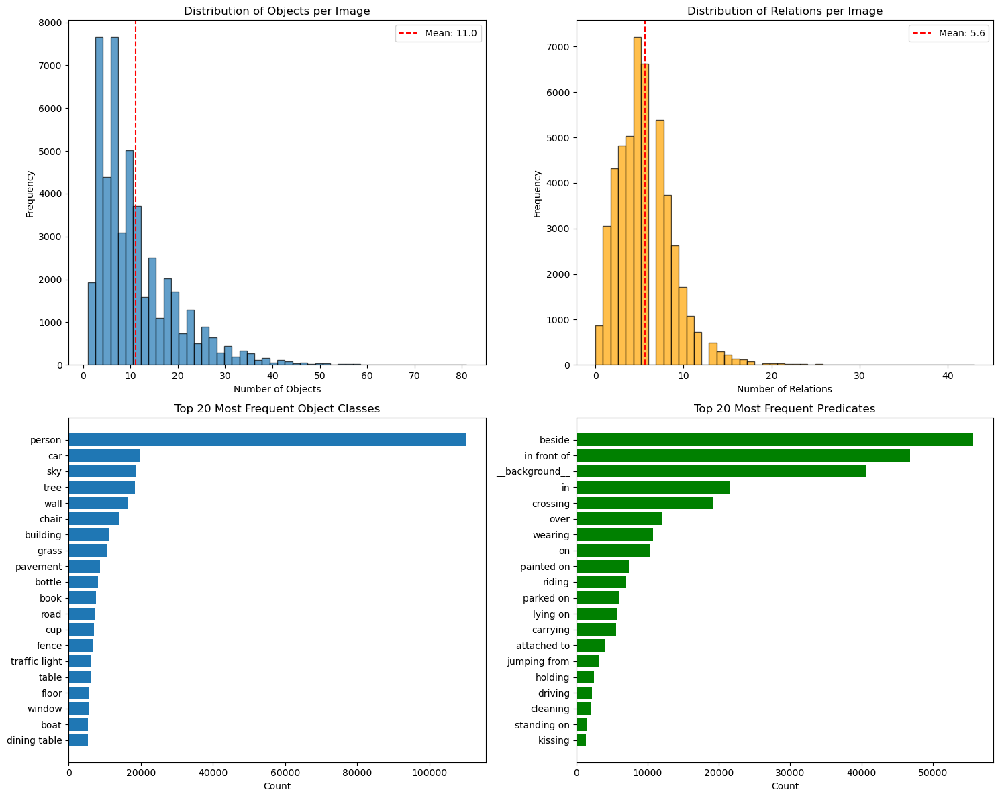

In [31]:
# Visualize statistics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Objects per image distribution
axes[0, 0].hist(objects_per_image, bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].set_xlabel('Number of Objects')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Distribution of Objects per Image')
axes[0, 0].axvline(np.mean(objects_per_image), color='red', linestyle='--', label=f'Mean: {np.mean(objects_per_image):.1f}')
axes[0, 0].legend()

# Relations per image distribution
axes[0, 1].hist(relations_per_image, bins=50, edgecolor='black', alpha=0.7, color='orange')
axes[0, 1].set_xlabel('Number of Relations')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution of Relations per Image')
axes[0, 1].axvline(np.mean(relations_per_image), color='red', linestyle='--', label=f'Mean: {np.mean(relations_per_image):.1f}')
axes[0, 1].legend()

# Top 20 object classes
top_objects = object_class_counts.most_common(20)
obj_names = [obj_classes[obj_id] if obj_id < len(obj_classes) else f'ID_{obj_id}' for obj_id, _ in top_objects]
obj_counts = [count for _, count in top_objects]
axes[1, 0].barh(obj_names, obj_counts)
axes[1, 0].set_xlabel('Count')
axes[1, 0].set_title('Top 20 Most Frequent Object Classes')
axes[1, 0].invert_yaxis()

# Top 20 predicates
top_predicates = predicate_counts.most_common(20)
pred_names = [pred_classes[pred_id] if pred_id < len(pred_classes) else f'ID_{pred_id}' for pred_id, _ in top_predicates]
pred_counts = [count for _, count in top_predicates]
axes[1, 1].barh(pred_names, pred_counts, color='green')
axes[1, 1].set_xlabel('Count')
axes[1, 1].set_title('Top 20 Most Frequent Predicates')
axes[1, 1].invert_yaxis()

plt.tight_layout()
plt.show()

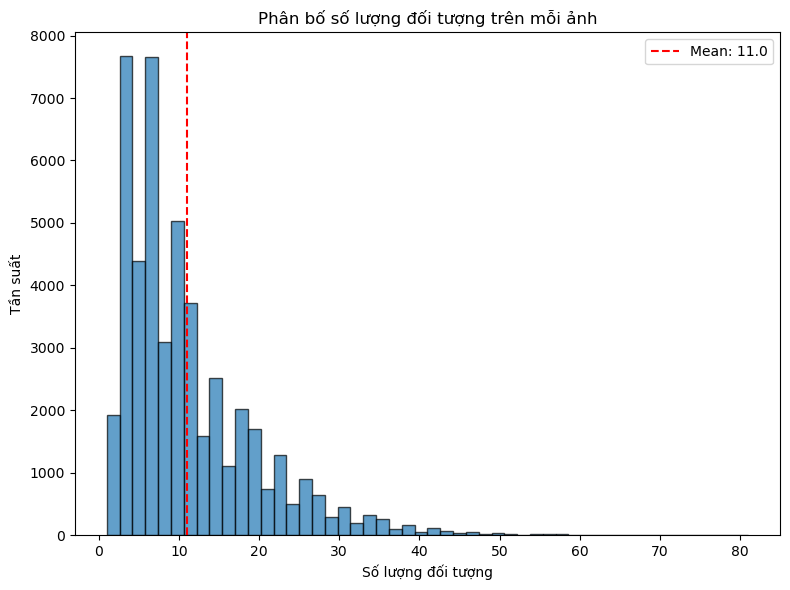

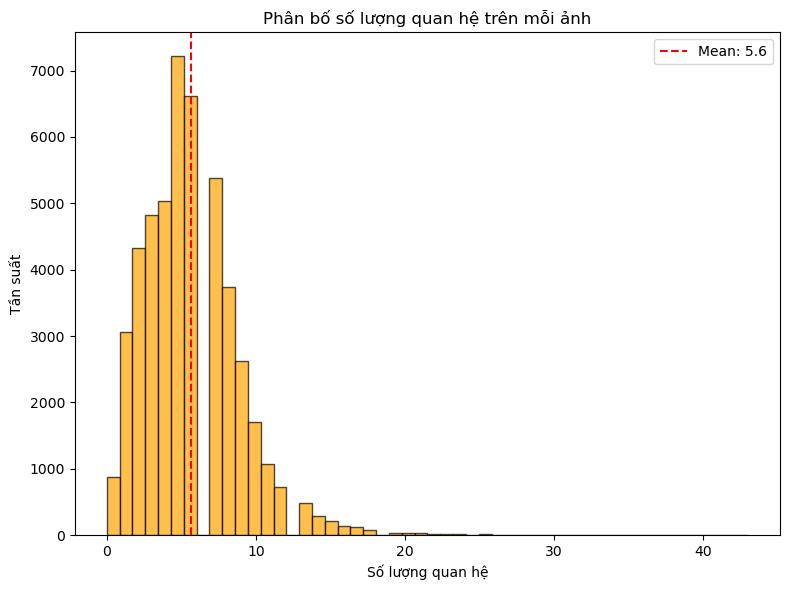

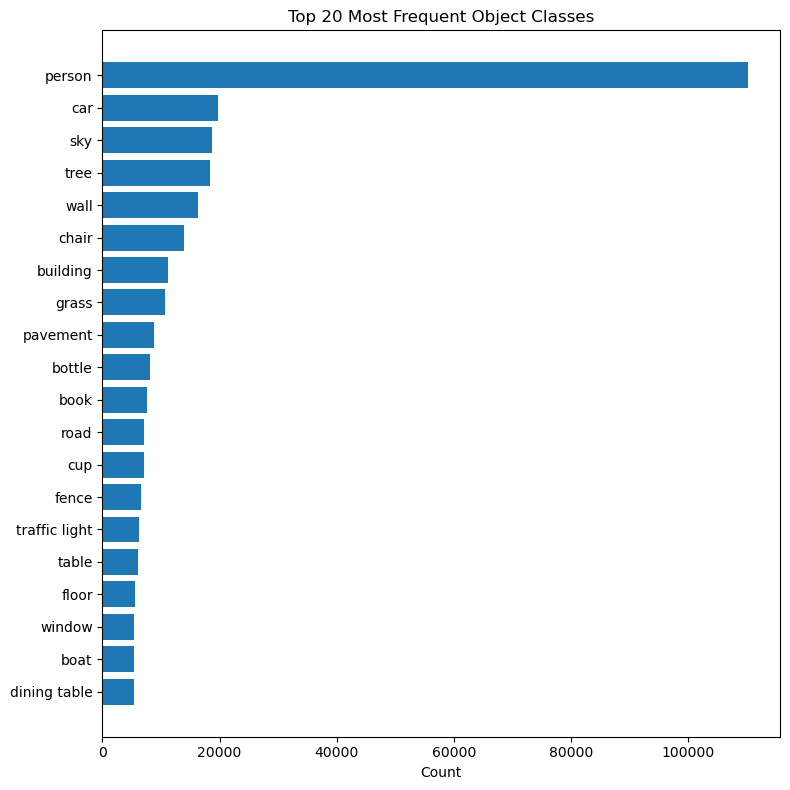

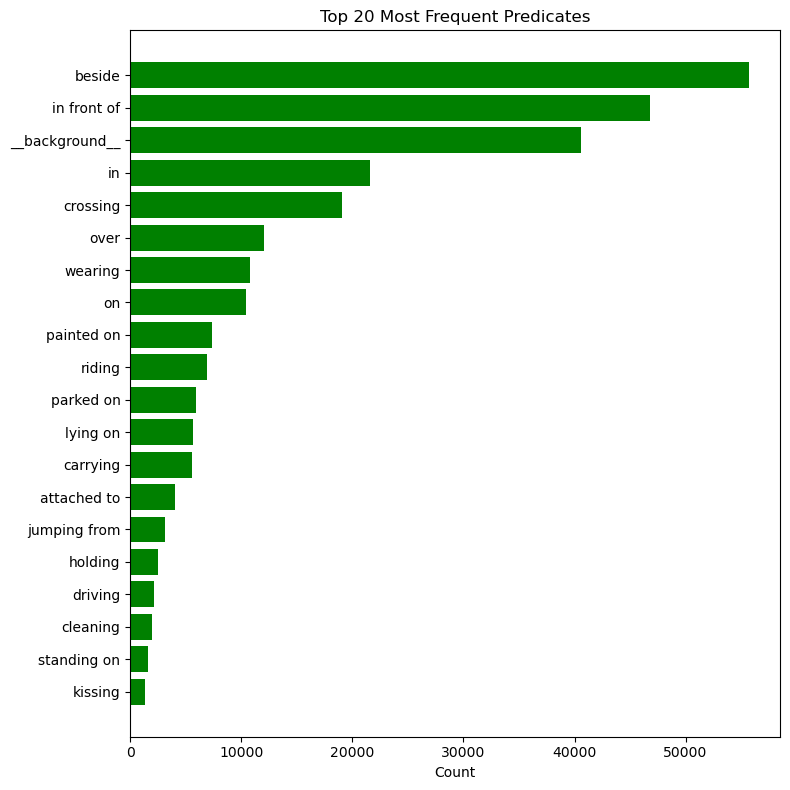

In [33]:
import matplotlib.pyplot as plt
import numpy as np

# ==== 1. Objects per image distribution ====
plt.figure(figsize=(8, 6))
plt.hist(objects_per_image, bins=50, edgecolor='black', alpha=0.7)
plt.xlabel('Số lượng đối tượng')
plt.ylabel('Tần suất')
plt.title('Phân bố số lượng đối tượng trên mỗi ảnh')
plt.axvline(np.mean(objects_per_image), color='red', linestyle='--', 
            label=f'Mean: {np.mean(objects_per_image):.1f}')
plt.legend()
plt.tight_layout()
plt.show()


# ==== 2. Relations per image distribution ====
plt.figure(figsize=(8, 6))
plt.hist(relations_per_image, bins=50, edgecolor='black', alpha=0.7, color='orange')
plt.xlabel('Số lượng quan hệ')
plt.ylabel('Tần suất')
plt.title('Phân bố số lượng quan hệ trên mỗi ảnh')
plt.axvline(np.mean(relations_per_image), color='red', linestyle='--',
            label=f'Mean: {np.mean(relations_per_image):.1f}')
plt.legend()
plt.tight_layout()
plt.show()


# ==== 3. Top 20 object classes ====
plt.figure(figsize=(8, 8))
top_objects = object_class_counts.most_common(20)
obj_names = [obj_classes[obj_id] if obj_id < len(obj_classes) else f'ID_{obj_id}' 
             for obj_id, _ in top_objects]
obj_counts = [count for _, count in top_objects]

plt.barh(obj_names, obj_counts)
plt.xlabel('Count')
plt.title('Top 20 Most Frequent Object Classes')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


# ==== 4. Top 20 predicates ====
plt.figure(figsize=(8, 8))
top_predicates = predicate_counts.most_common(20)
pred_names = [pred_classes[pred_id] if pred_id < len(pred_classes) else f'ID_{pred_id}' 
              for pred_id, _ in top_predicates]
pred_counts = [count for _, count in top_predicates]

plt.barh(pred_names, pred_counts, color='green')
plt.xlabel('Count')
plt.title('Top 20 Most Frequent Predicates')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


## 3. Hàm trực quan hóa Scene Graph

In [22]:
def visualize_scene_graph(img_data, show_relations=True, max_relations=20):
    """
    Trực quan hóa một ảnh với bounding boxes và relationships
    
    Args:
        img_data: Dictionary chứa thông tin ảnh từ PSG dataset
        show_relations: Có hiển thị relationships hay không
        max_relations: Số lượng relationships tối đa để hiển thị
    """
    # Load image
    img_path = os.path.join(COCO_IMAGES, img_data['file_name'])
    
    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        return
    
    img = Image.open(img_path)
    img_array = np.array(img)
    
    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=(16, 12))
    ax.imshow(img_array)
    
    # Generate colors for each object
    num_objects = len(img_data['annotations'])
    colors = plt.cm.tab20(np.linspace(0, 1, max(num_objects, 20)))
    
    # Draw bounding boxes and labels
    bbox_centers = {}  # Store centers for drawing relations
    
    for idx, ann in enumerate(img_data['annotations']):
        bbox = ann['bbox']  # [x, y, x2, y2] format
        category_id = ann['category_id']
        
        # Get class name
        class_name = obj_classes[category_id] if category_id < len(obj_classes) else f'ID_{category_id}'
        
        # Calculate bbox parameters
        x, y, x2, y2 = bbox
        width = x2 - x
        height = y2 - y
        
        # Store center for relations
        bbox_centers[idx] = ((x + x2) / 2, (y + y2) / 2)
        
        # Draw bounding box
        color = colors[idx % len(colors)]
        rect = patches.Rectangle((x, y), width, height, 
                                linewidth=2, edgecolor=color, 
                                facecolor='none', linestyle='-')
        ax.add_patch(rect)
        
        # Add label with background
        label = f'{idx}: {class_name}'
        ax.text(x, y - 5, label, 
               bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.7),
               fontsize=9, color='white', weight='bold')
    
    # Draw relationships
    if show_relations and 'relations' in img_data:
        relations_to_show = img_data['relations'][:max_relations]
        
        for rel in relations_to_show:
            subj_idx, obj_idx, pred_id = rel
            
            if subj_idx not in bbox_centers or obj_idx not in bbox_centers:
                continue
            
            # Get predicate name
            pred_name = pred_classes[pred_id] if pred_id < len(pred_classes) else f'pred_{pred_id}'
            
            # Get centers
            start_pos = bbox_centers[subj_idx]
            end_pos = bbox_centers[obj_idx]
            
            # Draw arrow
            arrow = FancyArrowPatch(start_pos, end_pos,
                                  arrowstyle='->', mutation_scale=20,
                                  linewidth=2, color='red', alpha=0.6,
                                  connectionstyle="arc3,rad=0.3")
            ax.add_patch(arrow)
            
            # Add predicate label
            mid_x = (start_pos[0] + end_pos[0]) / 2
            mid_y = (start_pos[1] + end_pos[1]) / 2
            ax.text(mid_x, mid_y, pred_name,
                   bbox=dict(boxstyle='round,pad=0.2', facecolor='yellow', alpha=0.7),
                   fontsize=8, color='black', weight='bold')
    
    # Set title with info
    title = f"Image: {img_data['file_name']}\n"
    title += f"Objects: {len(img_data['annotations'])}, Relations: {len(img_data.get('relations', []))}"
    if 'location' in img_data and img_data['location']:
        title += f", Location: {img_data['location']}"
    if 'weather' in img_data and img_data['weather']:
        title += f", Weather: {img_data['weather']}"
    
    ax.set_title(title, fontsize=12, weight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print relationships
    if show_relations and 'relations' in img_data:
        print("\nRelationships:")
        for i, rel in enumerate(relations_to_show):
            subj_idx, obj_idx, pred_id = rel
            if subj_idx < len(img_data['annotations']) and obj_idx < len(img_data['annotations']):
                subj_class = obj_classes[img_data['annotations'][subj_idx]['category_id']]
                obj_class = obj_classes[img_data['annotations'][obj_idx]['category_id']]
                pred_name = pred_classes[pred_id] if pred_id < len(pred_classes) else f'pred_{pred_id}'
                print(f"{i+1}. [{subj_idx}]{subj_class} --[{pred_name}]--> [{obj_idx}]{obj_class}")
        
        if len(img_data['relations']) > max_relations:
            print(f"\n... and {len(img_data['relations']) - max_relations} more relationships")

## 4. Trực quan hóa một số ảnh mẫu

Found 29546 images with at least 5 objects and 5 relations


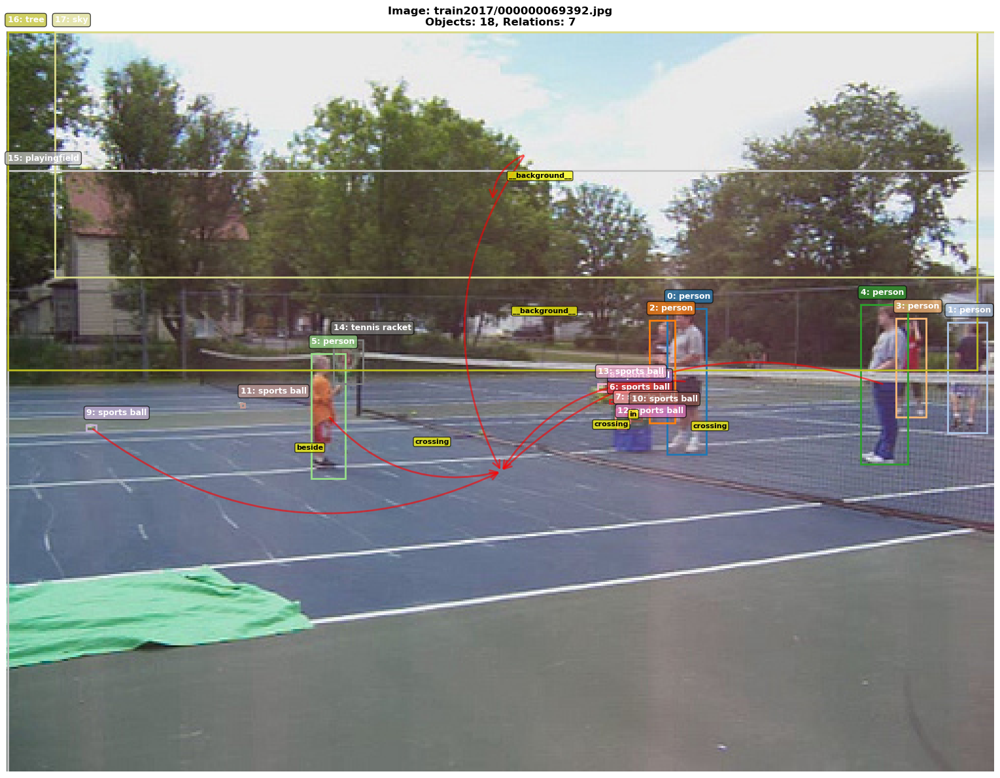


Relationships:
1. [0]person --[crossing]--> [15]playingfield
2. [4]person --[crossing]--> [15]playingfield
3. [5]person --[crossing]--> [15]playingfield
4. [9]sports ball --[beside]--> [15]playingfield
5. [10]sports ball --[in]--> [7]sports ball
6. [17]sky --[__background__]--> [15]playingfield
7. [17]sky --[__background__]--> [16]tree


In [23]:
# Chọn một ảnh ngẫu nhiên có nhiều relationships
# Lọc các ảnh có ít nhất 5 objects và 5 relations
good_images = [img for img in psg_data['data'] 
               if len(img['annotations']) >= 5 and len(img.get('relations', [])) >= 5]

print(f"Found {len(good_images)} images with at least 5 objects and 5 relations")

# Visualize một ảnh ngẫu nhiên
if good_images:
    sample_img = random.choice(good_images)
    visualize_scene_graph(sample_img, show_relations=True, max_relations=15)

## 5. Trực quan hóa ảnh theo chỉ số

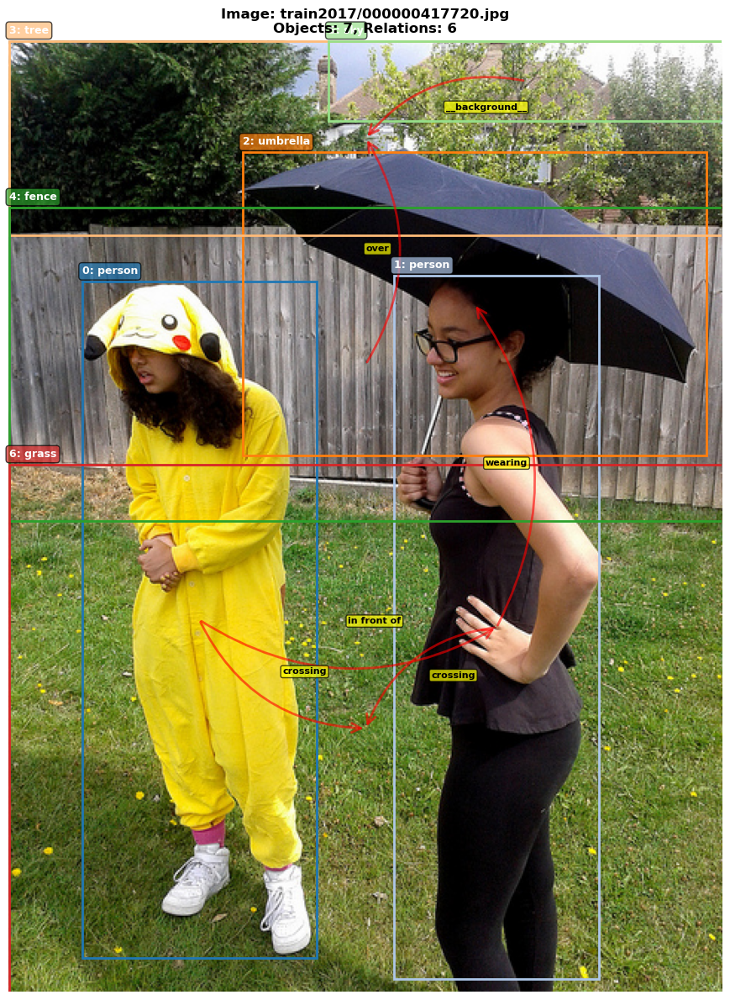


Relationships:
1. [0]person --[in front of]--> [1]person
2. [0]person --[crossing]--> [6]grass
3. [1]person --[wearing]--> [2]umbrella
4. [1]person --[crossing]--> [6]grass
5. [4]fence --[over]--> [3]tree
6. [5]sky --[__background__]--> [3]tree


In [24]:
# Visualize ảnh đầu tiên
visualize_scene_graph(psg_data['data'][0], show_relations=True, max_relations=20)

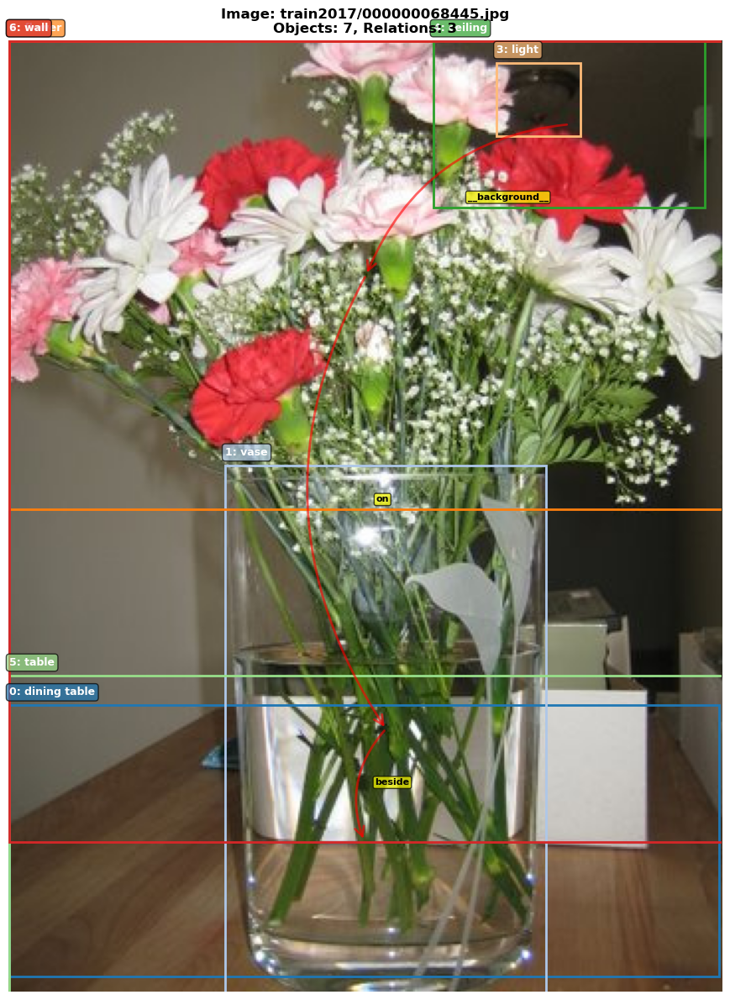


Relationships:
1. [1]vase --[beside]--> [0]dining table
2. [2]flower --[on]--> [1]vase
3. [4]ceiling --[__background__]--> [2]flower


In [25]:
# Chọn index để xem ảnh cụ thể (thay đổi số này để xem ảnh khác)
image_index = 10
visualize_scene_graph(psg_data['data'][image_index], show_relations=True, max_relations=20)

## 6. Trực quan hóa nhiều ảnh


Sample 1/3


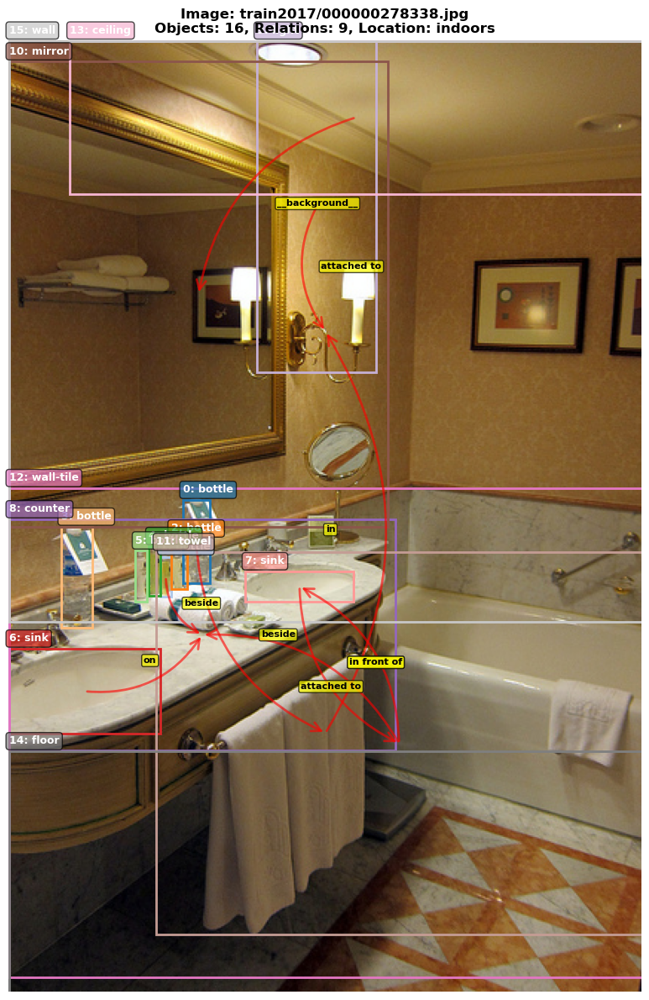


Relationships:
1. [0]bottle --[beside]--> [12]wall-tile
2. [1]bottle --[beside]--> [8]counter
3. [6]sink --[on]--> [8]counter
4. [7]sink --[in front of]--> [11]towel
5. [9]light --[attached to]--> [15]wall
6. [11]towel --[in front of]--> [7]sink
7. [11]towel --[attached to]--> [8]counter
8. [12]wall-tile --[in]--> [15]wall
9. [13]ceiling --[__background__]--> [10]mirror

Sample 2/3


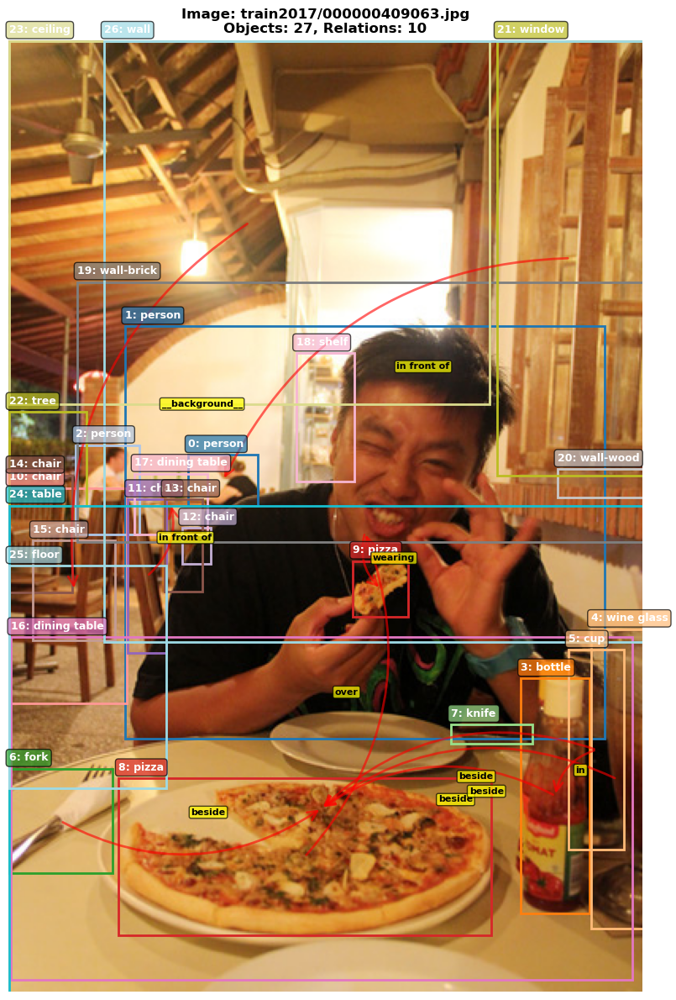


Relationships:
1. [1]person --[wearing]--> [9]pizza
2. [3]bottle --[beside]--> [16]dining table
3. [4]wine glass --[beside]--> [16]dining table
4. [5]cup --[in]--> [3]bottle
5. [5]cup --[beside]--> [16]dining table
6. [6]fork --[beside]--> [16]dining table
7. [8]pizza --[over]--> [1]person
8. [11]chair --[in front of]--> [17]dining table
9. [21]window --[in front of]--> [0]person
10. [23]ceiling --[__background__]--> [15]chair

Sample 3/3


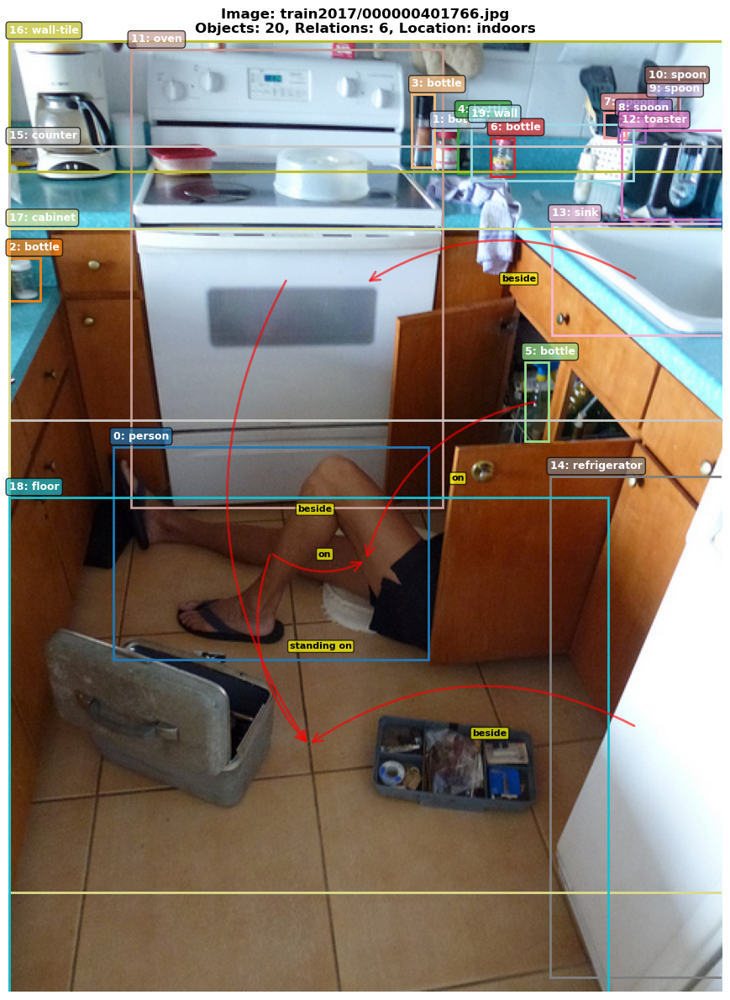


Relationships:
1. [0]person --[on]--> [17]cabinet
2. [0]person --[standing on]--> [18]floor
3. [5]bottle --[on]--> [17]cabinet
4. [11]oven --[beside]--> [18]floor
5. [13]sink --[beside]--> [15]counter
6. [14]refrigerator --[beside]--> [18]floor


In [26]:
# Visualize 3 ảnh ngẫu nhiên
num_samples = 3
sample_images = random.sample(good_images, min(num_samples, len(good_images)))

for i, img_data in enumerate(sample_images):
    print(f"\n{'='*80}")
    print(f"Sample {i+1}/{num_samples}")
    print(f"{'='*80}")
    visualize_scene_graph(img_data, show_relations=True, max_relations=15)

## 7. Tìm kiếm ảnh theo predicate cụ thể

Found 4047 images with predicate 'riding'


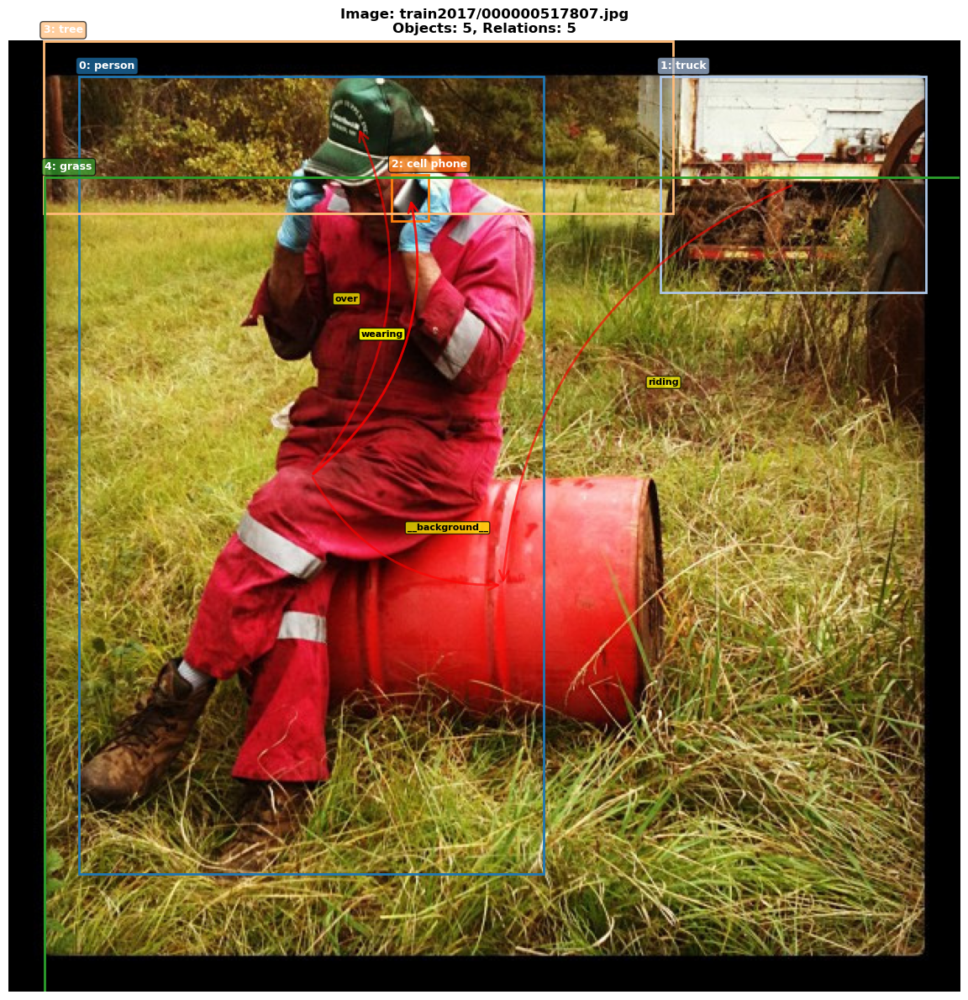


Relationships:
1. [0]person --[wearing]--> [2]cell phone
2. [0]person --[wearing]--> [2]cell phone
3. [0]person --[over]--> [3]tree
4. [0]person --[__background__]--> [4]grass
5. [1]truck --[riding]--> [4]grass


In [27]:
# Tìm ảnh có predicate cụ thể (ví dụ: "riding")
target_predicate = "riding"  # Thay đổi predicate này

# Find predicate ID
pred_id = pred_classes.index(target_predicate) if target_predicate in pred_classes else -1

if pred_id != -1:
    # Find images with this predicate
    images_with_pred = []
    for img in psg_data['data']:
        for rel in img.get('relations', []):
            if rel[2] == pred_id:
                images_with_pred.append(img)
                break
    
    print(f"Found {len(images_with_pred)} images with predicate '{target_predicate}'")
    
    if images_with_pred:
        # Show first image
        visualize_scene_graph(images_with_pred[0], show_relations=True, max_relations=20)
else:
    print(f"Predicate '{target_predicate}' not found in dataset")

## 8. Tìm kiếm ảnh theo object class

Found 26382 images with object 'person'


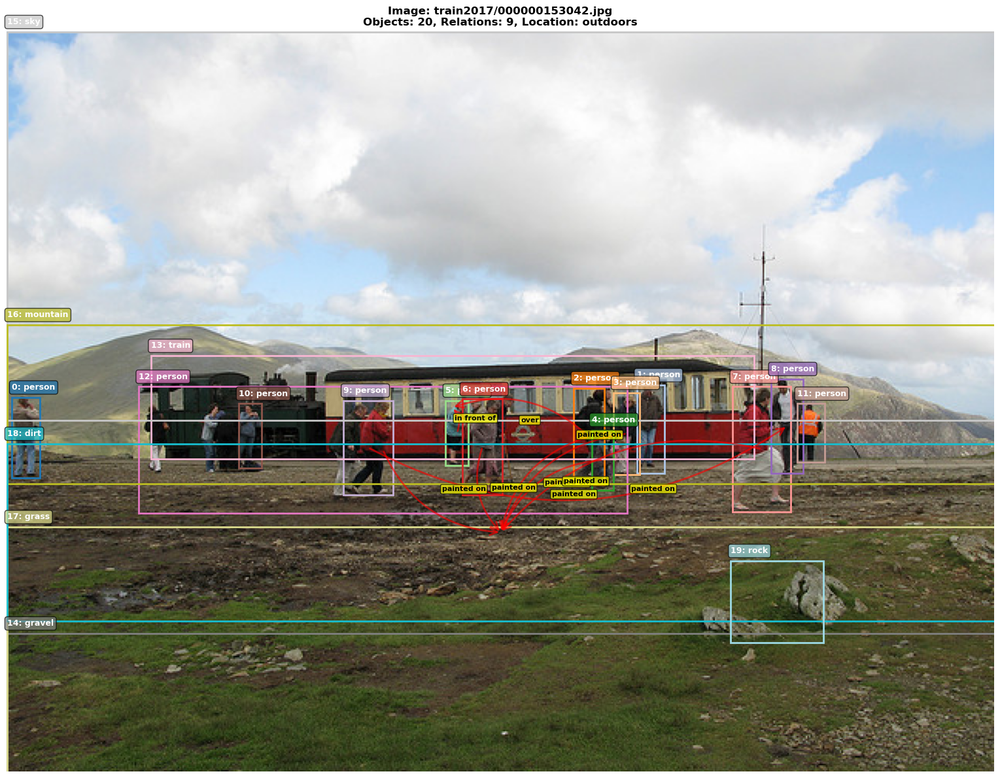


Relationships:
1. [2]person --[over]--> [13]train
2. [2]person --[painted on]--> [18]dirt
3. [3]person --[painted on]--> [18]dirt
4. [4]person --[painted on]--> [18]dirt
5. [5]person --[in front of]--> [13]train
6. [6]person --[painted on]--> [18]dirt
7. [7]person --[painted on]--> [18]dirt
8. [9]person --[painted on]--> [8]person
9. [12]person --[painted on]--> [18]dirt


In [28]:
# Tìm ảnh có object class cụ thể (ví dụ: "person")
target_object = "person"  # Thay đổi object này

# Find object ID
obj_id = obj_classes.index(target_object) if target_object in obj_classes else -1

if obj_id != -1:
    # Find images with this object
    images_with_obj = []
    for img in psg_data['data']:
        for ann in img['annotations']:
            if ann['category_id'] == obj_id:
                images_with_obj.append(img)
                break
    
    print(f"Found {len(images_with_obj)} images with object '{target_object}'")
    
    if images_with_obj:
        # Show a random image
        sample = random.choice(images_with_obj)
        visualize_scene_graph(sample, show_relations=True, max_relations=20)
else:
    print(f"Object '{target_object}' not found in dataset")

## 9. Phân tích quan hệ giữa các object classes

In [29]:
# Tạo ma trận quan hệ giữa các object pairs
from collections import defaultdict

# Count relationships between object pairs
object_pair_relations = defaultdict(lambda: defaultdict(int))

for img_data in psg_data['data']:
    annotations = img_data['annotations']
    
    for rel in img_data.get('relations', []):
        subj_idx, obj_idx, pred_id = rel
        
        if subj_idx < len(annotations) and obj_idx < len(annotations):
            subj_class_id = annotations[subj_idx]['category_id']
            obj_class_id = annotations[obj_idx]['category_id']
            
            subj_class = obj_classes[subj_class_id] if subj_class_id < len(obj_classes) else f'ID_{subj_class_id}'
            obj_class = obj_classes[obj_class_id] if obj_class_id < len(obj_classes) else f'ID_{obj_class_id}'
            pred_name = pred_classes[pred_id] if pred_id < len(pred_classes) else f'pred_{pred_id}'
            
            key = f"{subj_class} -> {obj_class}"
            object_pair_relations[key][pred_name] += 1

# Find most common object pairs and their relationships
sorted_pairs = sorted(object_pair_relations.items(), 
                     key=lambda x: sum(x[1].values()), reverse=True)[:20]

print("Top 20 Most Common Object Pairs and Their Relationships:\n")
for i, (pair, preds) in enumerate(sorted_pairs, 1):
    total = sum(preds.values())
    print(f"{i}. {pair} ({total} relations)")
    top_preds = sorted(preds.items(), key=lambda x: x[1], reverse=True)[:3]
    for pred, count in top_preds:
        print(f"   - {pred}: {count}")
    print()

Top 20 Most Common Object Pairs and Their Relationships:

1. person -> person (11346 relations)
   - in front of: 6116
   - carrying: 1584
   - over: 1370

2. sky -> tree (5673 relations)
   - __background__: 5548
   - beside: 116
   - in front of: 4

3. person -> pavement (4939 relations)
   - painted on: 1967
   - crossing: 1964
   - beside: 566

4. car -> road (4541 relations)
   - parked on: 2015
   - riding: 1659
   - beside: 825

5. sky -> building (4161 relations)
   - __background__: 4083
   - beside: 68
   - in front of: 6

6. person -> playingfield (3149 relations)
   - crossing: 1602
   - beside: 538
   - walking on: 434

7. sky -> person (2792 relations)
   - __background__: 2713
   - beside: 72
   - over: 3

8. person -> grass (2707 relations)
   - crossing: 1461
   - painted on: 337
   - beside: 325

9. person -> road (2514 relations)
   - painted on: 1075
   - crossing: 828
   - beside: 249

10. person -> surfboard (2156 relations)
   - beside: 551
   - wearing: 505
   -

## 10. Export thống kê ra file

In [30]:
# Tạo báo cáo thống kê
report = {
    'total_images': total_images,
    'total_objects': total_objects,
    'total_relations': total_relations,
    'avg_objects_per_image': float(np.mean(objects_per_image)),
    'avg_relations_per_image': float(np.mean(relations_per_image)),
    'top_20_objects': [(obj_classes[obj_id], count) for obj_id, count in object_class_counts.most_common(20)],
    'top_20_predicates': [(pred_classes[pred_id], count) for pred_id, count in predicate_counts.most_common(20)],
}

# Save report
output_file = 'psg_dataset_statistics.json'
with open(output_file, 'w') as f:
    json.dump(report, f, indent=2)

print(f"Statistics saved to {output_file}")

Statistics saved to psg_dataset_statistics.json
